Progetto (traccia)

Progetto Finale: Generazione Condizionata di Immagini con cWGAN-GP

Obiettivo del Progetto
Benvenuti al progetto finale del modulo sulle GAN! La vostra sfida sarà implementare una Conditional Wasserstein GAN con Gradient Penalty (cWGAN-GP) per generare immagini realistiche appartenenti a categorie specifiche.
Dimenticate i dataset "giocattolo" come MNIST; lavorerete con il dataset STL-10, una sfida reale che richiede la gestione di immagini a colori (RGB) e architetture convoluzionali profonde. L'obiettivo è produrre un generatore capace di creare, a comando, immagini coerenti di aerei, uccelli, navi e altre classi del dataset.

Requisiti Tecnici
Il vostro progetto dovrà integrare i seguenti pilastri tecnologici analizzati durante il corso:
1) Stabilità del training (WGAN-GP): implementazione della Wasserstein Loss e del calcolo del Gradient Penalty per evitare il Mode Collapse e stabilizzare i gradienti.
2) Controllo dell'Output (Conditional GAN): Utilizzo di etichette di classe (labels) per condizionare sia il Generatore che il Critico, passando dalla generazione casuale alla generazione mirata.
3) Architettura Convoluzionale: Utilizzo di layer Conv2DTranspose per l'upsampling (Generatore) e Conv2D con stride per il downsampling (Critico).
4) Integrazione Classi: Utilizzo di Embedding Layers per iniettare l'informazione semantica della classe nelle reti.

Traccia delle Attività

Fase 1: Data Pipeline
- Caricamento del Dataset: Utilizzate torchvision.datasets per scaricare e caricare la porzione 'train' di STL-10.
- Preprocessing: Assicuratevi che le immagini siano ridimensionate a 64x64 pixel e normalizzate nell'intervallo [-1, 1].
- Batching: Utilizzate un DataLoader con una batch_size suggerita di 64 o 128.

Fase 2: Sviluppo del Generatore
- Progettare una rete che riceva in input un vettore di rumore \(z\) e una classe \(y\).
- Utilizzare layer Dense, Reshape e blocchi di Conv2DTranspose alternati a BatchNormalization e ReLU.
- Layer finale con attivazione tanh.

Fase 3: Sviluppo del Critico
- Progettare un "Critico" che valuti coppie (Immagine, Classe).
- Utilizzare LayerNormalization invece di BatchNormalization (come richiesto dallo standard WGAN-GP).
- L'output deve essere un singolo valore scalare non vincolato (nessuna attivazione finale Sigmoid).

Fase 4: Custom Training Loop
- Implementare il ciclo di addestramento manuale.
- Calcolare il Gradient Penalty su campioni interpolati.
- Aggiornare il Critico 5 volte per ogni aggiornamento del Generatore.

Fase 5: Validazione e Visualizzazione
- Dopo ogni 10 epoche, generare una "Galleria delle Classi": una griglia di immagini dove ogni riga rappresenta una delle 10 categorie di STL-10.
- Graficare l'andamento della loss del Critico per confermare la convergenza.

Cosa consegnare
 Notebook Jupyter / Script Python: Il codice deve essere pulito, modulare e ampiamente commentato. Risultati Visivi: Almeno 3 immagini che mostrino l'evoluzione della generazione (all'inizio, a metà e a fine training).Breve Relazione (Opzionale): Una nota sulle iper-parametri scelti (learning rate, dimensione embedding, coefficiente GP) e sulle difficoltà incontrate.

Buon lavoro! La qualità delle vostre immagini sintetiche sarà il miglior indicatore del vostro successo

In [27]:
# Il dataset STL-10 contiene tante immagini classificate in 10 categorie: 
# airplane, bird, car, cat, deer, dog, horse, monkey, ship, truck
# Da costruire una rete capace di generare un'immagine data una categoria (cWGAN-GP)
# Generator: produce immagini
# Critic: calcola lo score, immagini reali score più alto, immagini fake score più basso
# Wasserstein Distance = quando lavoro devo fare per trasfomare una ditribuzione (fake) in un altra (real)?

import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from torch.utils.data import DataLoader

# --- 1. CONFIGURAZIONE E IPERPARAMETRI ---
# Seleziona la GPU se disponibile per accelerare il calcolo, altrimenti usa la CPU
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"DEVICE utilizzato: {DEVICE}")

# Dimensione del vettore latente (rumore casuale in input al generatore)
Z_DIM = 100
# Learning rate per l'ottimizzatore Adam
LEARNING_RATE = 1e-4  #0.0001
# Dimensione del batch di immagini processate ad ogni iterazione
BATCH_SIZE = 64
# Dimensione immagine
IMAGE_SIZE = 64

FEATURES_GEN=64
FEATURES_CRITIC = 64

CHANNELS_IMG=3

# Numero di aggiornamenti del Critico per ogni aggiornamento del Generatore.
# Più aggiornamenti del Critico consentono di ottenere una migliore
# approssimazione della funzione Wasserstein prima di aggiornare il Generatore.
N_CRITIC = 5
# Coefficiente per il Gradient Penalty (lambda).
# Questo valore determina quanto pesantemente penalizzare le violazioni del vincolo matematico di Lipschitz.
LAMBDA_GP = 10  
# Numero di classi di STL-10
NUM_CLASSES = 10
EMBEDDING_DIM = 100
NUM_EPOCHS = 50 # lavoro su CPU non posso mettere valori alti
# Rendo gli esperimento riproducibili
SEED = 42
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

# --- 2. PREPARAZIONE DEI DATI ---
# Pipeline di trasformazione delle immagini:
# 1. Convertiamo l'immagine in un formato tensore che PyTorch può gestire.
# 2. Normalizziamo i valori dei pixel dall'intervallo [0, 1] all'intervallo [-1, 1].
#    normalizziamo i dati reali in [-1,1] per renderli coerenti con il range prodotto dalla Tanh del Generator.
#    Questo facilita il lavoro del Generatore che usa la funzione di attivazione Tanh (output tra -1 e 1).
transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE,IMAGE_SIZE)), #STL-10 ha immagini 96x96 e le porto a 64x64
    transforms.ToTensor(),  # porta i pixel cica d [0,255] a [0,1]
    # normalizzo da -1 a 1 coerente con la  Tanh finale del Generator
    transforms.Normalize([0.5 for _ in range(CHANNELS_IMG)], [0.5 for _ in range(CHANNELS_IMG)]) 
]) 

# Caricamento del dataset.
# Il DataLoader gestisce la creazione dei batch e il mescolamento (shuffle) dei dati.
dataset = torchvision.datasets.STL10(
    root="./data", 
    split="train", 
    transform=transform, 
    download=True)
# Creazione dei mini-batch
loader = DataLoader(
    dataset, 
    batch_size=BATCH_SIZE, 
    shuffle=True,
    num_workers=0,
    pin_memory=(DEVICE.type == "cuda"),
    #persistent_workers=True,
    drop_last=True #solo batch completi
)

images, labels = next(iter(loader))

print("Shape immagini:", images.shape)
print("Shape labels:", labels.shape)
print("Min pixel:", images.min().item())
print("Max pixel:", images.max().item())
print("Prime labels:", labels[:10])

print("Tipo immagini:", images.dtype)
print("Tipo labels:", labels.dtype)
print("Classi presenti nel batch:", torch.unique(labels))


DEVICE utilizzato: cpu
Shape immagini: torch.Size([64, 3, 64, 64])
Shape labels: torch.Size([64])
Min pixel: -1.0
Max pixel: 1.0
Prime labels: tensor([1, 2, 6, 8, 3, 0, 8, 7, 9, 9])
Tipo immagini: torch.float32
Tipo labels: torch.int64
Classi presenti nel batch: tensor([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])


# --- 3. DEFINIZIONE DELLE ARCHITETTURE ---

In [28]:

# =============================================================================
# ARCHITETTURA DEL GENERATORE 
# =============================================================================

# Classe Generatore: il suo obiettivo è prendere il rumore casuale e trasformarlo in un'immagine convincente.
class Generator(nn.Module):
    def __init__(self, channels_img, z_dim, num_classes, embed_size):
        super(Generator, self).__init__()

        # Embedding apprendibile della classe
        # per ogni classe crea embedding= vettore di 100 valori
        # n.classi x n.valori per classe = 10 classi x 100 valori
        # l'embedding è imparato durante il training. 
        # All'inizio ho 100 valori casuali, 
        # poi vengono aggiornati con backpropagation
        self.embed = nn.Embedding(num_classes,embed_size)

        # input dimensione rumore + dimensione label = 
        # 100+100 = 200 valori
        # output 64x8x4x4=512x4x4x=8192 valori per immagine
        self.fc = nn.Linear(z_dim + embed_size,FEATURES_GEN * 8 * 4 * 4)        

        self.net = nn.Sequential(
            # Input: [B, 512, 4, 4] -> [B, 256, 8, 8]
            self._block(FEATURES_GEN * 8,FEATURES_GEN * 4,4, 2, 1),
            # [B, 256, 8, 8] -> [B, 128, 16, 16]
            self._block(FEATURES_GEN * 4,FEATURES_GEN * 2,4, 2, 1),
            # [B, 128, 16, 16] -> [B, 64, 32, 32]
            self._block(FEATURES_GEN * 2,FEATURES_GEN,4, 2, 1),
            # [B, 64, 32, 32] -> [B, 3, 64, 64]
            # alla  fine bobb applico l'intero blocco ma solo ConvTranspose2d e Tanh
            nn.ConvTranspose2d(FEATURES_GEN,channels_img,kernel_size=4,stride=2,padding=1),            
            nn.Tanh(),
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            # aumento la dimensione dell'immagine (upsampling), produce  nuove feature
            # parte da una rappresentazione piccola e 
            # progressivamente costruisce una immagine vera
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            # normalizzo
            nn.BatchNorm2d(out_channels),
            # funzione di attivazione, introduco non linearità
            nn.ReLU(),
        )

    def forward(self, z, labels):
        # creo embedding per ogni labels del batch [64,100]
        embedding = self.embed(labels)
        # concateno rumore con embedding del batch
        # [64,100] concateno [64,100]=[64,200]
        x = torch.cat([z, embedding],dim=1) #z=rumore embedding=classe emb.
        # Dense
        x = self.fc(x)
        # Reshape:
        # [B, 8192] -> [B,512,4,4] se FEATURES_GEN=64
        x = x.view(-1,FEATURES_GEN * 8,4,4)

        return self.net(x)


In [29]:
# =============================================================================
# ARCHITETTURA DEL CRITICO 
# =============================================================================

# Critic riceve immagine + classe, si chiede: 
# "questa immagine è reale ed è coerente con la classe indicata?"
class Critic(nn.Module):
    def __init__(self, channels_img, num_classes, img_size):
        super(Critic, self).__init__()
        self.img_size = img_size
        # Trasforma ogni classe in una mappa spaziale 64x64 [10,64x64]=[10,4096]
        self.embed = nn.Embedding(num_classes,img_size * img_size)        
        self.disc = nn.Sequential(
            # Input: immagine RGB + mappa label
            # [B, 4, 64, 64]
            # Output:
            # [B, FEATURES_CRITIC, 32, 32]
            nn.Conv2d(channels_img + 1, FEATURES_CRITIC, kernel_size=4, stride=2, padding=1), # 32x32
            nn.LeakyReLU(0.2),
            # 32x32 -> 16x16
            self._block(FEATURES_CRITIC, FEATURES_CRITIC * 2, 4, 2, 1, 16), # 16x16
            # 16x16 -> 8x8
            self._block(FEATURES_CRITIC * 2, FEATURES_CRITIC * 4, 4, 2, 1, 8), # 8x8
            # 8x8 -> 4x4
            self._block(FEATURES_CRITIC * 4, FEATURES_CRITIC * 8, 4, 2, 1, 4), # 4x4
            # 4x4 -> 1x1
            nn.Conv2d(FEATURES_CRITIC * 8, 1, kernel_size=4, stride=1, padding=0), # 1x1
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding, output_size):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            # WGAN-GP:
            # LayerNorm come richiesto dalla consegna.
            nn.LayerNorm([out_channels, output_size,output_size]), 
            nn.LeakyReLU(0.2),
        )

    def forward(self, x, labels):
        # [B] -> [B, 4096]
        embedding = self.embed(labels)
        # [B,4096] -> [B,1,64,64]
        embedding = embedding.view(labels.shape[0],1,self.img_size,self.img_size)
        # concateno immagine (x) con embegging labels
        # immagini[B,3,64,64] + classi[B,1,64,64] -> [B,4,64,64]
        # il critic riceve la mappa della classe e l'immagine RGB
        x = torch.cat([x, embedding],dim=1)

        score = self.disc(x)
        # [B,1,1,1] -> [B,1]
        return score.view(-1, 1) #immagine 1 -> score, immagine 2 -> score

In [30]:
critic = Critic(CHANNELS_IMG,NUM_CLASSES,IMAGE_SIZE).to(DEVICE)
test_scores = critic(images.to(DEVICE),labels.to(DEVICE))

print("Shape output Critic:", test_scores.shape)
print("Primi score:", test_scores[:5])

Shape output Critic: torch.Size([64, 1])
Primi score: tensor([[0.2264],
        [0.2311],
        [0.1400],
        [0.4853],
        [0.1142]], grad_fn=<SliceBackward0>)


In [31]:
# =============================================================================
# GRADIENT PENALTY
# =============================================================================

def gradient_penalty(critic, labels, real, fake):
    # dimensione reale del batch corrente
    batch_size=real.shape[0]
    # per ogni immagine genero un valore casuale, applicato a tutti i pixel dell'immagine
    alpha = torch.rand((batch_size, 1, 1, 1), device=real.device)
    # crea immagine interpolata, cioè un'immagine tra immagini reali e fake
    # alpha determina quanto pesa l'immagine reale,
    # mentre (1 - alpha) determina quanto pesa l'immagine fake.
    interpolated_images = real * alpha + fake.detach() * (1 - alpha)
    # necessario per calcolare dC/dx
    interpolated_images.requires_grad_(True)

    # Calcola critic score
    mixed_scores = critic(interpolated_images, labels)

    # Calcola il gradiente dello score del Critic rispetto
    # ai pixel dell'immagine interpolata:
    # misura quanto lo score è sensibile a piccole variazioni dell'immagine.
    gradient = torch.autograd.grad(
        inputs=interpolated_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
    )[0]

    # [B, 3, 64, 64] -> [B, 12288] = unico vettore di gradienti
    gradient = gradient.reshape(batch_size,-1)
    # 12288 gradienti -> norma L2 -> un singolo numero
    # Norma L2 del gradiente per ogni immagine
    gradient_norm = gradient.norm(2,dim=1)
    # Gradient Penalty
    gp = torch.mean((gradient_norm - 1) ** 2)
    return gp

In [32]:
# Inizializzazione dei modelli e spostamento sul dispositivo (CPU o GPU)
gen = Generator(CHANNELS_IMG,Z_DIM,NUM_CLASSES,EMBEDDING_DIM).to(DEVICE)
critic = Critic(CHANNELS_IMG,NUM_CLASSES,IMAGE_SIZE).to(DEVICE)

# test
noise = torch.randn(BATCH_SIZE,Z_DIM,device=DEVICE)
test_labels = torch.randint(0,NUM_CLASSES,(BATCH_SIZE,),device=DEVICE)

fake_images = gen(noise, test_labels)
critic_scores = critic(fake_images, test_labels)

print("Fake images:", fake_images.shape)
print("Critic scores:", critic_scores.shape)

Fake images: torch.Size([64, 3, 64, 64])
Critic scores: torch.Size([64, 1])


In [33]:
# test del gradient penalty
gp_test = gradient_penalty(critic,test_labels,images.to(DEVICE),fake_images)

print("Gradient Penalty:", gp_test)
print("Shape GP:", gp_test.shape)

Gradient Penalty: tensor(0.1645, grad_fn=<MeanBackward0>)
Shape GP: torch.Size([])


In [34]:

# Definizione degli ottimizzatori. Adam funziona bene con WGAN-GP.
opt_G = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.9))
opt_C = optim.Adam(critic.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.9))

print("Generator su:", next(gen.parameters()).device)
print("Critic su:", next(critic.parameters()).device)

Generator su: cpu
Critic su: cpu


In [35]:
#ho un pc molto lento, pertanto genero prima la galleria di immagini
import matplotlib.pyplot as plt
import os

# =============================================================================
# 6. CONFIGURAZIONE GALLERIA DELLE CLASSI
# =============================================================================

SAMPLES_PER_CLASS = 4 # immagini per classe

# Rumore fisso: non cambia tra un'epoca e l'altra per un miglior confronto
fixed_noise = torch.randn(NUM_CLASSES * SAMPLES_PER_CLASS,Z_DIM,device=DEVICE)
fixed_labels = torch.arange(NUM_CLASSES,device=DEVICE).repeat_interleave(SAMPLES_PER_CLASS)
# 10 classi x 4 campioni = 40 immagini che dovrà generare gen

print("Shape fixed_noise:", fixed_noise.shape)
print("Shape fixed_labels:", fixed_labels.shape)
print("Labels:", fixed_labels)

Shape fixed_noise: torch.Size([40, 100])
Shape fixed_labels: torch.Size([40])
Labels: tensor([0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 3, 4, 4, 4, 4, 5, 5, 5, 5,
        6, 6, 6, 6, 7, 7, 7, 7, 8, 8, 8, 8, 9, 9, 9, 9])


In [36]:
# =============================================================================
# 7. VISUALIZZAZIONE DEI RISULTATI
# =============================================================================

# Questa funzione non addestra, prende il Generator dopo le varie epoche 
# del training e chiede di visualizzare un'immagine per ogni classe
# quindi per ogni epoca vedo casa sa fare gen

def visualizza_risultati(generator,fixed_noise,fixed_labels,epoch, samples_per_class=SAMPLES_PER_CLASS):

    print(f"Generazione galleria - epoca {epoch}...")

    # Nomi delle 10 classi STL-10.
    #classes = ("airplane","bird","car","cat","deer","dog","horse","monkey","ship","truck")
    classes = dataset.classes

    # Mettiamo il Generator in modalità valutazione.
    # le modalità sono 2:
    # - train() sto addestrando la rete
    # - eval() sto usando per valutazione, mi fa vede cosa ha imparato (non addestro)
    generator.eval()

    # Durante la generazione non dobbiamo calcolare gradienti.
    with torch.no_grad():
        # genero immagine
        fake_images = generator(fixed_noise,fixed_labels)

    # Il Generator produce valori nell'intervallo [-1, 1].
    # Li riportiamo nell'intervallo [0, 1]
    # per visualizzarli correttamente con Matplotlib.
    fake_images = (fake_images + 1) / 2

    # Limitiamo eventuali piccoli errori numerici.
    fake_images = fake_images.clamp(0, 1)

    # Matplotlib lavora sulla CPU.
    fake_images = fake_images.cpu()

    # Creiamo una griglia:
    # 10 righe = 10 classi
    # 4 colonne = 4 immagini per ogni classe
    fig, axes = plt.subplots(NUM_CLASSES,samples_per_class,figsize=(10, 20))

    image_index = 0
    for class_idx in range(NUM_CLASSES):
        for sample_idx in range(samples_per_class):
            image = fake_images[image_index]

            # PyTorch: [C, H, W]
            # Matplotlib: [H, W, C]
            image = image.permute(1, 2, 0)

            axes[class_idx, sample_idx].imshow(image)

            axes[class_idx, sample_idx].axis("off")

            # Scrivo il nome della classe
            if sample_idx == 0:
                axes[class_idx, sample_idx].text(
                    -0.20,  # posizione a sinistra dell'immagine
                    0.5, # centrato verticalmente
                    classes[class_idx], # nome della classe
                    transform=axes[class_idx, sample_idx].transAxes,
                    ha="right",  # allineamento orizzontale
                    va="center", # allineamento verticale
                    fontsize=11,
                    fontweight="bold"
                )

            image_index += 1

    plt.suptitle(f"cWGAN-GP- STL-10 - Epoca {epoch}",fontsize=16)
    plt.tight_layout()

    # Salvataggio della galleria.
    file_name = f"gallery_epoch_{epoch:03d}.png"
    plt.savefig(file_name,dpi=150,bbox_inches="tight")
    plt.show()

    # Torniamo in modalità training.
    generator.train()

    print(f"Galleria salvata: {file_name}")

Epoch [1/50] Batch [0/78] Loss C: -17.3197 Loss G: 12.3714 GP: 0.0711W-Distance: 18.0309
Epoch [1/50] Batch [10/78] Loss C: -44.0220 Loss G: 33.0794 GP: 0.7865W-Distance: 51.8867
Epoch [1/50] Batch [20/78] Loss C: -48.9364 Loss G: 42.3147 GP: 0.2437W-Distance: 51.3731
Epoch [1/50] Batch [30/78] Loss C: -37.8595 Loss G: 34.6921 GP: 1.2093W-Distance: 49.9529
Epoch [1/50] Batch [40/78] Loss C: -33.5129 Loss G: 47.0677 GP: 1.1965W-Distance: 45.4774
Epoch [1/50] Batch [50/78] Loss C: -26.3602 Loss G: 45.1960 GP: 0.9902W-Distance: 36.2622
Epoch [1/50] Batch [60/78] Loss C: -30.5719 Loss G: 51.5603 GP: 0.9766W-Distance: 40.3379
Epoch [1/50] Batch [70/78] Loss C: -29.9774 Loss G: 41.5758 GP: 0.3474W-Distance: 33.4513

Fine epoca 1:
Critic Loss media = -32.4552 | Generator Loss media = 32.3819

Epoch [2/50] Batch [0/78] Loss C: -25.3091 Loss G: 41.1422 GP: 0.1960W-Distance: 27.2693
Epoch [2/50] Batch [10/78] Loss C: -32.7689 Loss G: 25.4264 GP: 0.7404W-Distance: 40.1729
Epoch [2/50] Batch [20/7

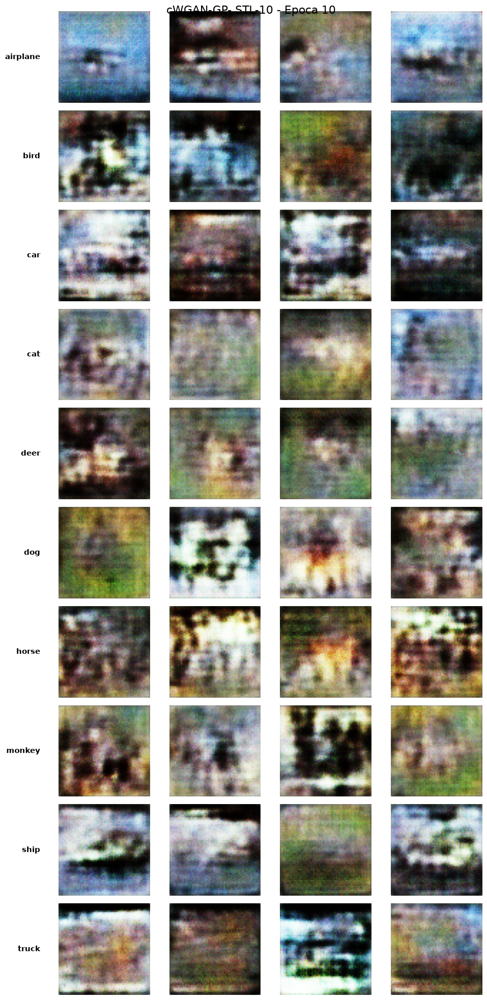

Galleria salvata: gallery_epoch_010.png
Epoch [11/50] Batch [0/78] Loss C: -18.7735 Loss G: 67.6930 GP: 0.8006W-Distance: 26.7797
Epoch [11/50] Batch [10/78] Loss C: -19.2895 Loss G: 47.7307 GP: 0.4989W-Distance: 24.2781
Epoch [11/50] Batch [20/78] Loss C: -17.4716 Loss G: 66.1107 GP: 0.5361W-Distance: 22.8323
Epoch [11/50] Batch [30/78] Loss C: -17.4170 Loss G: 75.7289 GP: 0.2722W-Distance: 20.1391
Epoch [11/50] Batch [40/78] Loss C: -16.8340 Loss G: 49.7097 GP: 0.4645W-Distance: 21.4789
Epoch [11/50] Batch [50/78] Loss C: -18.8272 Loss G: 35.5872 GP: 0.5991W-Distance: 24.8187
Epoch [11/50] Batch [60/78] Loss C: -14.8740 Loss G: 63.7391 GP: 0.1378W-Distance: 16.2520
Epoch [11/50] Batch [70/78] Loss C: -19.0201 Loss G: 39.6896 GP: 0.4323W-Distance: 23.3430

Fine epoca 11:
Critic Loss media = -14.0952 | Generator Loss media = 60.1112

Epoch [12/50] Batch [0/78] Loss C: -15.0309 Loss G: 47.8408 GP: 0.2977W-Distance: 18.0083
Epoch [12/50] Batch [10/78] Loss C: -16.5374 Loss G: 47.5853 GP:

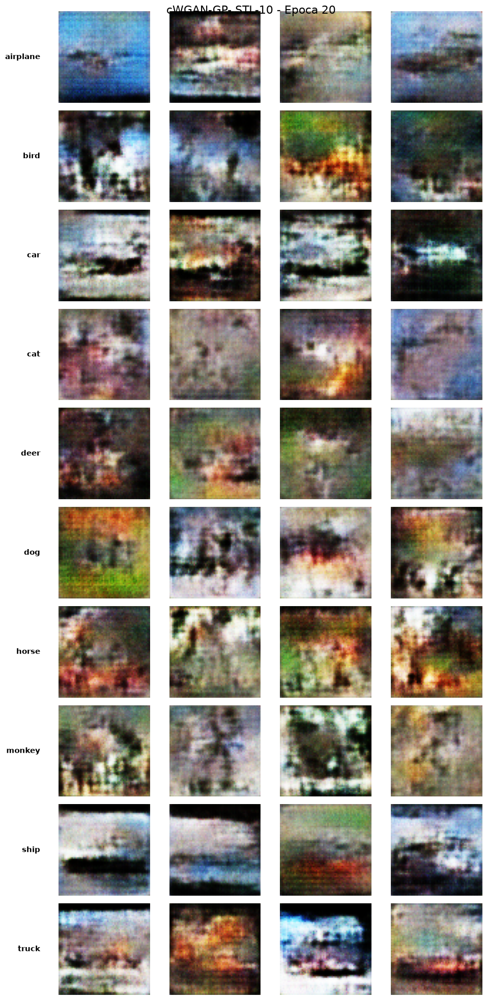

Galleria salvata: gallery_epoch_020.png
Epoch [21/50] Batch [0/78] Loss C: -14.9449 Loss G: 55.6222 GP: 0.1603W-Distance: 16.5482
Epoch [21/50] Batch [10/78] Loss C: -18.0275 Loss G: 56.6417 GP: 0.8255W-Distance: 26.2829
Epoch [21/50] Batch [20/78] Loss C: -16.9249 Loss G: 54.0341 GP: 0.4640W-Distance: 21.5649
Epoch [21/50] Batch [30/78] Loss C: -17.7373 Loss G: 41.4043 GP: 0.6710W-Distance: 24.4476
Epoch [21/50] Batch [40/78] Loss C: -15.2829 Loss G: 51.8358 GP: 0.2206W-Distance: 17.4888
Epoch [21/50] Batch [50/78] Loss C: -15.0049 Loss G: 51.9084 GP: 0.1904W-Distance: 16.9087
Epoch [21/50] Batch [60/78] Loss C: -12.6103 Loss G: 41.5582 GP: 0.8388W-Distance: 20.9980
Epoch [21/50] Batch [70/78] Loss C: -15.8350 Loss G: 46.9491 GP: 0.4650W-Distance: 20.4847

Fine epoca 21:
Critic Loss media = -12.5559 | Generator Loss media = 48.8395

Epoch [22/50] Batch [0/78] Loss C: -17.6643 Loss G: 48.4472 GP: 0.1825W-Distance: 19.4889
Epoch [22/50] Batch [10/78] Loss C: -17.8431 Loss G: 50.3923 GP:

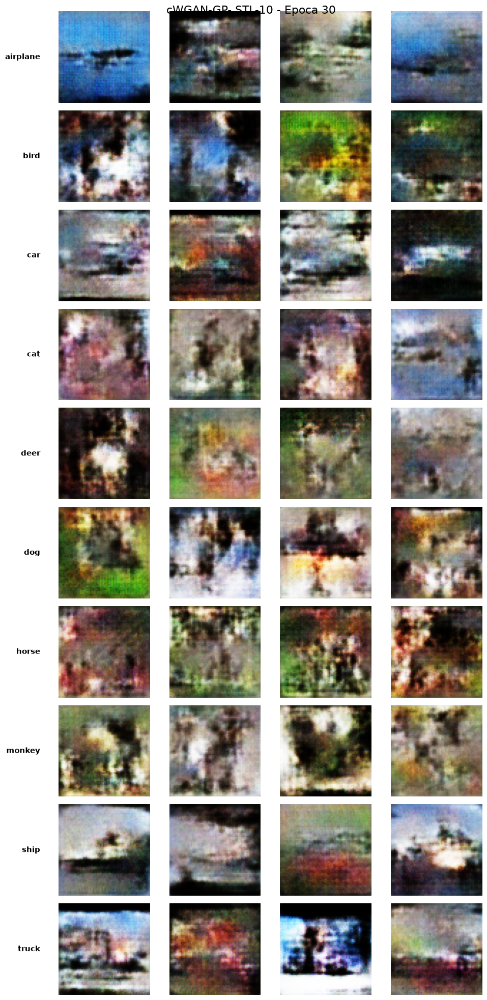

Galleria salvata: gallery_epoch_030.png
Epoch [31/50] Batch [0/78] Loss C: -15.3215 Loss G: 26.6260 GP: 0.2345W-Distance: 17.6666
Epoch [31/50] Batch [10/78] Loss C: -13.5383 Loss G: 29.1928 GP: 0.1504W-Distance: 15.0422
Epoch [31/50] Batch [20/78] Loss C: -14.0585 Loss G: 29.1026 GP: 0.3822W-Distance: 17.8810
Epoch [31/50] Batch [30/78] Loss C: -13.3852 Loss G: 26.4467 GP: 0.4949W-Distance: 18.3338
Epoch [31/50] Batch [40/78] Loss C: -13.1104 Loss G: 29.4539 GP: 1.0263W-Distance: 23.3737
Epoch [31/50] Batch [50/78] Loss C: -14.1814 Loss G: 27.2647 GP: 0.2425W-Distance: 16.6062
Epoch [31/50] Batch [60/78] Loss C: -14.6382 Loss G: 21.0420 GP: 0.5059W-Distance: 19.6969
Epoch [31/50] Batch [70/78] Loss C: -16.3660 Loss G: 13.7382 GP: 0.5082W-Distance: 21.4476

Fine epoca 31:
Critic Loss media = -11.3844 | Generator Loss media = 27.7926

Epoch [32/50] Batch [0/78] Loss C: -14.1511 Loss G: 19.9216 GP: 0.6709W-Distance: 20.8604
Epoch [32/50] Batch [10/78] Loss C: -14.6268 Loss G: 31.6222 GP:

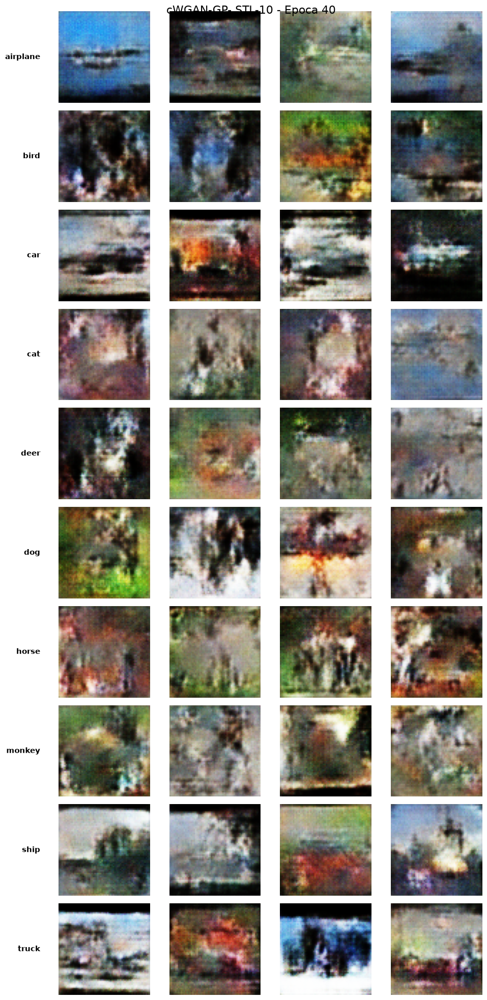

Galleria salvata: gallery_epoch_040.png
Epoch [41/50] Batch [0/78] Loss C: -15.7644 Loss G: 24.8645 GP: 0.5616W-Distance: 21.3801
Epoch [41/50] Batch [10/78] Loss C: -14.9270 Loss G: 21.3582 GP: 0.2920W-Distance: 17.8472
Epoch [41/50] Batch [20/78] Loss C: -13.1816 Loss G: 26.4263 GP: 0.6932W-Distance: 20.1138
Epoch [41/50] Batch [30/78] Loss C: -14.7357 Loss G: 26.5898 GP: 0.3666W-Distance: 18.4019
Epoch [41/50] Batch [40/78] Loss C: -11.1040 Loss G: 22.0047 GP: 0.0950W-Distance: 12.0540
Epoch [41/50] Batch [50/78] Loss C: -14.1564 Loss G: 27.2618 GP: 0.0764W-Distance: 14.9208
Epoch [41/50] Batch [60/78] Loss C: -17.1865 Loss G: 21.5542 GP: 0.2477W-Distance: 19.6639
Epoch [41/50] Batch [70/78] Loss C: -12.9743 Loss G: 24.7580 GP: 0.5357W-Distance: 18.3310

Fine epoca 41:
Critic Loss media = -10.4843 | Generator Loss media = 23.4334

Epoch [42/50] Batch [0/78] Loss C: -12.8529 Loss G: 30.1883 GP: 0.4320W-Distance: 17.1729
Epoch [42/50] Batch [10/78] Loss C: -15.3522 Loss G: 17.1315 GP:

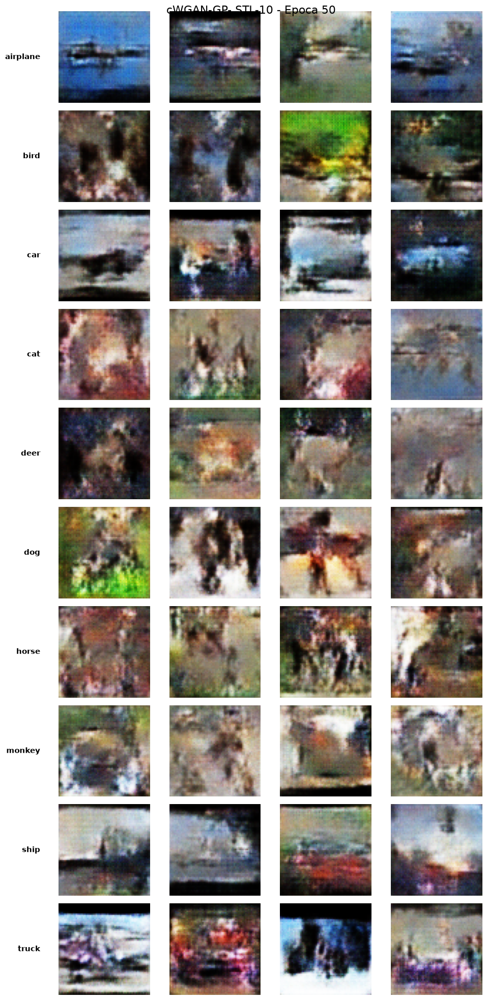

Galleria salvata: gallery_epoch_050.png


In [37]:
# =============================================================================
# 5. CUSTOM TRAINING LOOP cWGAN-GP
# =============================================================================

#NUM_EPOCHS = 1  # Prima prova: una sola epoca

critic_losses = []
generator_losses = []

gen.train()
critic.train()

for epoch in range(NUM_EPOCHS):

    critic_loss_epoch = 0.0
    generator_loss_epoch = 0.0
    num_critic_updates = 0
    num_generator_updates = 0

    for batch_idx, (real, labels) in enumerate(loader):

        # -------------------------------------------------------------
        # Preparazione batch
        # -------------------------------------------------------------
        real = real.to(DEVICE)
        labels = labels.to(DEVICE)

        batch_size = real.shape[0]

        # =============================================================
        # 1. TRAINING DEL CRITICO
        #    N_CRITIC aggiornamenti per ogni aggiornamento Generator
        # =============================================================

        loss_C = None
        gp = None
        for _ in range(N_CRITIC): #n_critici volte il critic e una volta il generator

            # Nuovo rumore casuale
            noise = torch.randn(batch_size,Z_DIM,device=DEVICE)
            # Generazione immagini fake condizionate sulle stesse label
            fake = gen(noise, labels)
            # Score immagini reali
            critic_real = critic(real,labels)
            # Score immagini fake
            # detach evita di aggiornare il Generator durante il training del Critico
            # detach interrompe il percorso del gradiente verso il generator
            critic_fake = critic(fake.detach(),labels)
            # Gradient Penalty
            gp = gradient_penalty(critic,labels,real,fake)

            # ---------------------------------------------------------
            # Wasserstein Critic Loss + Gradient Penalty
            # minimizziamo:
            # E[C(fake)] - E[C(real)] + lambda * GP
            # ---------------------------------------------------------
            loss_C = (critic_fake.mean() - critic_real.mean() + LAMBDA_GP * gp)
            wasserstein_distance = (critic_real.mean()-critic_fake.mean()).item()        
            # Azzera gradienti precedenti
            opt_C.zero_grad(set_to_none=True)
            # Backpropagation
            loss_C.backward()
            # Aggiornamento Critico
            opt_C.step()

            critic_loss_epoch += loss_C.item()
            num_critic_updates += 1

        # =============================================================
        # 2. TRAINING DEL GENERATORE
        #    Un aggiornamento dopo N_CRITIC aggiornamenti del Critico
        # =============================================================

        # Nuovo rumore per il Generator
        noise = torch.randn(batch_size,Z_DIM,device=DEVICE)
        # Nuove immagini fake
        fake = gen(noise,labels)
        # Il Generator vuole ottenere score alti dal Critico
        critic_fake_for_gen = critic(fake,labels)
        loss_G = -critic_fake_for_gen.mean()

        # Azzera gradienti precedenti
        opt_G.zero_grad(set_to_none=True)
        # Backpropagation
        loss_G.backward()
        # Aggiornamento Generator
        opt_G.step()

        generator_loss_epoch += loss_G.item()
        num_generator_updates += 1

        # Visualizzazione andamento durante l'epoca
        if batch_idx % 10 == 0: #ogni 10 batch
            print(
                f"Epoch [{epoch + 1}/{NUM_EPOCHS}] "
                f"Batch [{batch_idx}/{len(loader)}] "
                f"Loss C: {loss_C.item():.4f} "
                f"Loss G: {loss_G.item():.4f} "
                f"GP: {gp.item():.4f}"
                f"W-Distance: {wasserstein_distance:.4f}"
            )

    # -----------------------------------------------------------------
    # Loss media dell'epoca
    # -----------------------------------------------------------------

    avg_critic_loss = (critic_loss_epoch / num_critic_updates)
    avg_generator_loss = (generator_loss_epoch / num_generator_updates)


    
    critic_losses.append(avg_critic_loss)
    generator_losses.append(avg_generator_loss)
    print(f"\nFine epoca {epoch + 1}:\nCritic Loss media = {avg_critic_loss:.4f} | Generator Loss media = {avg_generator_loss:.4f}\n")

    # -----------------------------------------------------------------
    # Salvataggio ogni 5 epoche
    # -----------------------------------------------------------------

    if (epoch + 1) % 5 == 0:
        torch.save(
            {
                "epoch": epoch + 1,
                "generator": gen.state_dict(),
                "critic": critic.state_dict(),
                "optimizer_G": opt_G.state_dict(),
                "optimizer_C": opt_C.state_dict(),
                "critic_losses": critic_losses,
                "generator_losses": generator_losses,
            },
            f"checkpoint_epoch_{epoch + 1}.pth"
        )    

    # -------------------------------------------------------------
    # VISUALIZZAZIONE ALLA FINE DI dell'EPOCA
    # -------------------------------------------------------------

    if (epoch + 1) % 10 == 0: # visualizzo ogni 10 epoche
        visualizza_risultati(gen,fixed_noise,fixed_labels,epoch=epoch + 1,samples_per_class=SAMPLES_PER_CLASS)

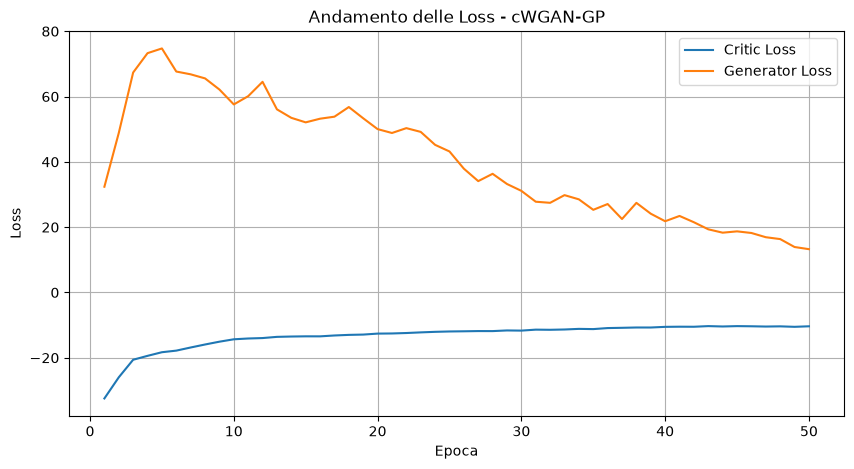

In [38]:
# GRAFICO DELLA LOSS

plt.figure(figsize=(10, 5))
plt.plot(range(1, len(critic_losses) + 1),critic_losses,label="Critic Loss")
plt.plot(range(1, len(generator_losses) + 1),generator_losses,label="Generator Loss")
plt.xlabel("Epoca")
plt.ylabel("Loss")
plt.title("Andamento delle Loss - cWGAN-GP")
plt.legend()
plt.grid(True)
plt.show()

Lavorando su CPU ho provato 10 epoche (38 minuti di esecuzione), il modello apprende progressivamente struttura e distribuzione cromatica ma non raggiunge  immagini nitide, incremento pertanto le epoche a 50